# ColPali'nin 🤗 Transformers Uygulaması

[![Colab](https://img.shields.io/badge/Open_in_Colab-F9AB00?logo=googlecolab&logoColor=fff&style=for-the-badge)](https://colab.research.google.com/github/tonywu71/colpali-cookbooks/blob/main/examples/use_transformers_native_colpali.ipynb)
[![Hugging Face](https://img.shields.io/badge/Vidore-FFD21E?style=for-the-badge&logo=huggingface&logoColor=000)](https://huggingface.co/vidore)

## Giriş

Orijinal notebook için Tony Wu'ya teşekkür ederiz üstteki linklerden orijinal notebooka erişebilirsiniz

*ColPali* kullanmak, karmaşık ve kırılgan olabilecek düzen tanıma ve OCR süreçlerine olan ihtiyacı, bir dokümanın hem metin hem de görsel içeriğini (düzen, grafikler, ...) dikkate alabilen tek bir model ile ortadan kaldırır. ColPali aynı zamanda yüksek yorumlanabilirliğe sahiptir: bölgeler ve sorgu tokenları arasında benzerlik haritaları elde edilebilir.


[![Hugging Face](https://img.shields.io/badge/ColPali_hf_transformers_documentation-FFD21E?style=for-the-badge&logo=huggingface&logoColor=000)](https://huggingface.co/docs/transformers/main/en/model_doc/colpali)

Bu not defteri, çıkarım, skorlama ve yorumlanabilirlik için `transformers` 🤗'dan yerel ColPali model uygulamasının kullanımı konusunda size rehberlik eder. API'de birkaç küçük fark olsa da, tüm temel işlevler orijinal uygulamayla (`colpali-engine==0.3.x`) aynıdır.

### Donanım Gereksinimleri

Google Colab'da (ücretsiz T4 GPU kullanarak) veya kendi bilgisayarınızda (M2 Pro Mac üzerinde test edilmiştir) çalıştırabilirsiniz. Colab'da `transformers` önceden yüklü olmasına rağmen, yeni ColPali modeline erişebilmeniz için ana dala güncellemeniz önerilir.


In [1]:
# Bölüm 1 için:
!pip install -q -U huggingface_hub git+https://github.com/huggingface/transformers.git accelerate torch pillow

# Bölüm 2 için:
# transformers ile sürüm çakışmasını önlemek için --no-deps kullanın
!pip install -q --no-deps "colpali-engine[interpretability]>=0.3.2,<0.4.0"
!pip install -q -U einops matplotlib seaborn

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 88.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.2/48.2 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 100.2 MB/s eta 0:00:00


## Bölüm 1: ColPali ile Çıkarım Yapma

### HuggingFace hesabına giriş

ColPali, VLM yapısı olarak PaliGemma (Gemma lisanslı) kullandığı için, [`google/paligemma-3b-mix-448`](https://huggingface.co/google/paligemma-3b-mix-448) şartlarını ve koşullarını kabul etmiş bir HuggingFace hesabına giriş yapmanız gerekecek.

In [2]:
# Hugging Face hesabına giriş
from huggingface_hub import notebook_login
notebook_login()

### İçe Aktarımlar + birkaç özel yardımcı fonksiyon

In [3]:
from io import BytesIO
from typing import List

import requests
import torch
from IPython.display import display
from PIL import Image
from transformers import ColPaliForRetrieval, ColPaliProcessor
import os

def get_torch_device(device: str = "auto") -> str:
    """
    PyTorch tarafından kullanılacak cihazı (string) döndürür.

    `device` argümanı varsayılan olarak "auto" kullanır ve bu:
    - "cuda:0" mevcutsa onu kullanır
    - aksi takdirde "mps" mevcutsa onu kullanır
    - aksi takdirde "cpu" kullanır.
    """
    if device == "auto":
        if torch.cuda.is_available():
            device = "cuda:0"
        elif torch.backends.mps.is_available():  # Apple Silicon için
            device = "mps"
        else:
            device = "cpu"

    return device


def load_image_from_url(url: str) -> Image.Image:
    """
    Geçerli bir URL'den bir PIL görüntüsü yükler.
    """
    response = requests.get(url)
    return Image.open(BytesIO(response.content))


def scale_image(image: Image.Image, new_height: int = 1024) -> Image.Image:
    """
    Bir görüntüyü en boy oranını koruyarak yeni bir boyuta ölçeklendirir.
    """
    # Ölçeklendirme faktörünü hesapla
    width, height = image.size
    aspect_ratio = width / height
    new_width = int(new_height * aspect_ratio)

    # Görüntüyü yeniden boyutlandır
    scaled_image = image.resize((new_width, new_height))

    return scaled_image

def load_images(image_urls: List[str] = None, image_dir: str=None) -> List[Image.Image]:
    """
    URL'lerden ve yerel bir dizinden görüntüleri yükler.

    Argümanlar:
    - image_urls (List[str]): Yüklenecek görüntü URL'lerinin listesi.
    - image_dir (str): Görüntülerin yükleneceği dizin yolu.

    Döndürür:
    - List[Image.Image]: Yüklenen PIL görüntülerinin listesi.
    """
    # URL'lerden görüntüleri yükle
    images = []

    if image_urls:
        images_from_urls = [load_image_from_url(url) for url in image_urls]
        images.extend(images_from_urls)

    # 'images' dizininden görüntüleri yükle
    if image_dir:
        images_from_dir = [Image.open(os.path.join(image_dir, file)) for file in os.listdir(image_dir) if file.endswith(('png', 'jpg', 'jpeg'))]
        images.extend(images_from_dir)
    # Tüm görüntüleri birleştir


    return images

### ColPali modelini ve işlemcisini yükleyin

model kartını açmak için aşağıdaki bağlantıya tıklayın  [`selimc/turkish-colpali`](https://huggingface.co/selimc/turkish-colpali).

In [4]:
model_name ="selimc/turkish-colpali" #"selimc/turkish-colpali"
device = get_torch_device("auto")

print(f"Using device: {device}")

model = ColPaliForRetrieval.from_pretrained(
    model_name,
    torch_dtype=torch.bfloat16,
    device_map=device,
).eval()

processor = ColPaliProcessor.from_pretrained(model_name)

Using device: cuda:0


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


adapter_config.json:   0%|          | 0.00/854 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.36k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/65.1k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/862M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

adapter_model.safetensors:   0%|          | 0.00/45.3M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/423 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/243k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/34.6M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/733 [00:00<?, ?B/s]

### Görüntü ve sorgu girdileri

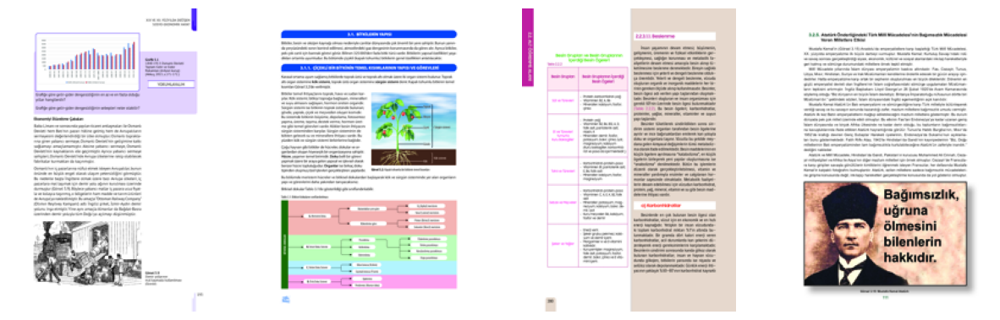

In [36]:
image_urls = [
    "https://ogmmateryal.eba.gov.tr/panel/upload/etki/6305/193.jpg",
    "https://ogmmateryal.eba.gov.tr/panel/upload/etki/4726/126.jpg",
    "https://ogmmateryal.eba.gov.tr/panel/upload/etki/5105/281.jpg",
    "https://ogmmateryal.eba.gov.tr/panel/upload/etki/6336/111.jpg"
]
images = load_images(image_urls = image_urls)

# Türkçe sorgular
queries = [
    "ekonomiyi düzeltme çabaları demir yolları gelir gider grafik",
    "bitkilerin yapısı bitkisel dokular meristem doku",
    "besin grupları tablosu karbonhidratlar",
    "Türk milli mücadelesi emperyalizm Atatürk görseli"
]

# Girdi görüntülerini yan yana önizle
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
for ax, image in zip(axes, images):
    ax.imshow(scale_image(image, 256))
    ax.axis('off')
plt.show()


### Sorguları ve görüntüleri işleme ve embedding'e çevirme

In [37]:
# Girdileri önişleme
batch_images = processor(images=images).to(model.device)
batch_queries = processor(text=queries).to(model.device)

# İleri geçiş
with torch.no_grad():
    image_embeddings = model(**batch_images).embeddings
    query_embeddings = model(**batch_queries).embeddings

### Sorguları görüntülere karşı skorlama

Görüntüler ve onlara karşılık gelen sorgular aynı sırada verildiğinde, maksimum puanların köşegen üzerinde olduğu bir puan matrisi elde etmelisiniz. Bu, modelin her sorgu için doğru görüntüyü getirdiği anlamına gelir.

In [38]:
scores = processor.score_retrieval(query_embeddings, image_embeddings)  # (n_queries, n_images)

scores

tensor([[19.0000, 14.5625, 15.3125, 16.5000],
        [15.5625, 20.2500, 17.8750, 15.7500],
        [12.4375, 14.0625, 18.7500, 11.9375],
        [15.0625, 13.4375, 12.8125, 20.8750]], dtype=torch.bfloat16)

Daha Anlaşılır Bir Çıktı Yazalım

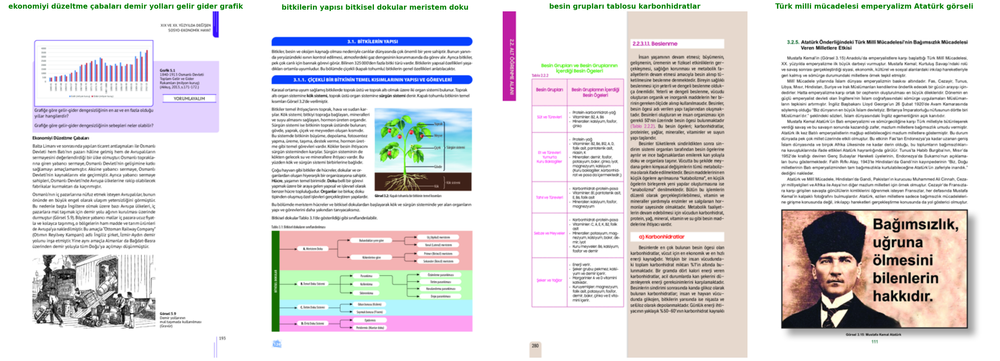

In [39]:
# Her sorgu için en yüksek puan alan resmi bul
max_indices = scores.argmax(dim=1)

# En yüksek puan alan resimleri getir
retrieved_images = [images[idx] for idx in max_indices]

# Getirilen resimleri ve onlara karşılık gelen sorguları göster
fig, axes = plt.subplots(1, len(retrieved_images), figsize=(30, 15))
for ax, image, query in zip(axes, retrieved_images, queries):
    ax.imshow(scale_image(image, 512))
    ax.set_title(query, fontsize=15, fontweight='bold', color='green')
    ax.axis('off')
plt.tight_layout()
plt.show()

## Bölüm 2: Benzerlik Haritaları Oluşturma

Bu bölüm, sorgu ve görüntü arasındaki benzerlik haritalarının nasıl oluşturulacağını açıklar. ColPali `transformers 🤗` ile benzerlik haritaları oluşturmak, `colpali-engine` uygulamasına neredeyse tamamen benzerdir. Bu nedenle, aşağıdaki kod minimal olacaktır.

### Ekstra İçe Aktarımlar

In [40]:
import pprint
from typing import Tuple

import matplotlib.pyplot as plt
from colpali_engine.interpretability import (
    get_similarity_maps_from_embeddings,
    plot_all_similarity_maps,
    plot_similarity_map,
)
from transformers import BatchFeature, ProcessorMixin


def get_n_patches(processor: ProcessorMixin, patch_size: int) -> Tuple[int, int]:
    n_patches_x = processor.image_processor.size["width"] // patch_size
    n_patches_y = processor.image_processor.size["height"] // patch_size
    return n_patches_x, n_patches_y


def get_image_mask(processor: ProcessorMixin, batch_images: BatchFeature) -> torch.Tensor:
    return batch_images.input_ids == processor.image_token_id

### Girdiler

Süreci basitleştirmek için, önceki bölümden ilk sorguyu ve ilk resmi kullanacağız.

In [41]:
image = images[0]
query = queries[0]
processed_query = processor(text=[query]).to(model.device)

image_embedding = image_embeddings[[0], ...]
query_embedding = query_embeddings[[0], ...]

### Her Token İçin Benzerlik Haritalarını Alın

In [42]:
# Yama sayısını ve görüntü maskesini alın
n_patches = get_n_patches(processor=processor, patch_size=model.vlm.vision_tower.config.patch_size)
image_mask = get_image_mask(processor=processor, batch_images=batch_images)

# Batch içindeki ilk görüntü için benzerlik haritalarını alın
batched_similarity_maps = get_similarity_maps_from_embeddings(
    image_embeddings=image_embedding,
    query_embeddings=query_embedding,
    n_patches=n_patches,
    image_mask=image_mask,
)

similarity_maps = batched_similarity_maps[0]  # (query_length, n_patches_x, n_patches_y)

# Bu hücre çıktısını kullanarak bir token seçmek için indeksini kullanın
query_content = processor.decode(processed_query.input_ids[0]).replace(processor.tokenizer.pad_token, "")
query_content = query_content.replace(processor.query_augmentation_token, "").strip()
query_tokens = processor.tokenizer.tokenize(query_content)

pprint.pprint({idx: val for idx, val in enumerate(query_tokens)})

{0: '<bos>',
 1: 'Question',
 2: ':',
 3: '▁ekonomi',
 4: 'yi',
 5: '▁düz',
 6: 'elt',
 7: 'me',
 8: '▁ç',
 9: 'ab',
 10: 'aları',
 11: '▁dem',
 12: 'ir',
 13: '▁yo',
 14: 'llar',
 15: 'ı',
 16: '▁gelir',
 17: '▁gider',
 18: '▁grafik'}


### İstediğiniz sorgu tokenını seçin ve ilişkili benzerlik haritasını görselleştirin

Seçilen token: `▁ekonomi`


Text(0.5, 1.0, 'Token #3: `▁ekonomi`. MaxSim skoru: 0.74')

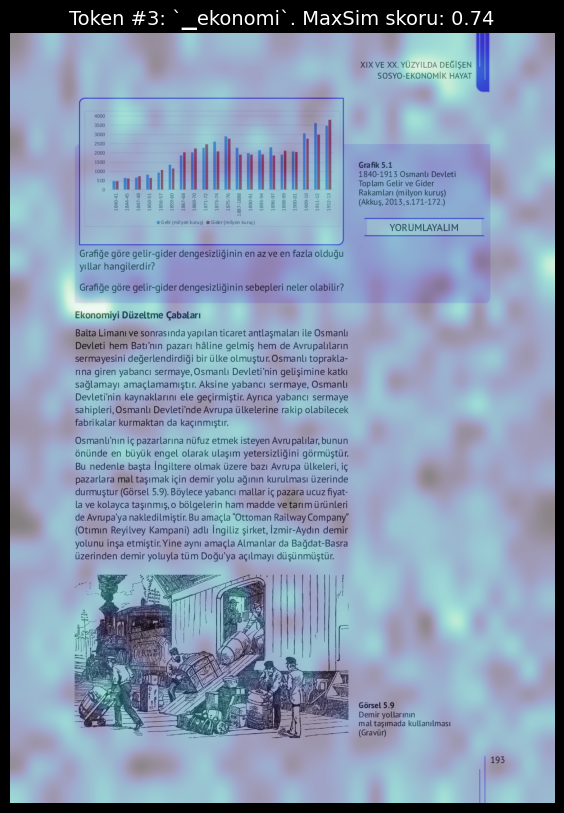

In [46]:
# Bir token'ı indeksini kullanarak seçin
token_idx = 3  # örn. "3: '▁ekonomi'," ise, ekonomi token'ını seçmek için 3 olarak ayarlayın

print(f"Seçilen token: `{query_tokens[token_idx]}`")

# Seçilen token için benzerlik haritasını getirin
current_similarity_map = similarity_maps[token_idx]  # (n_patches_x, n_patches_y)

fig, ax = plot_similarity_map(
    image=image,
    similarity_map=current_similarity_map,
    figsize=(8, 8),
    show_colorbar=False,
)

max_sim_score = similarity_maps[token_idx, :, :].max().item()
ax.set_title(f"Token #{token_idx}: `{query_tokens[token_idx]}`. MaxSim skoru: {max_sim_score:.2f}", fontsize=14)


Seçilen token ile en yüksek benzerlik puanına sahip yamalar daha parlak olacaktır. Bu benzerlik haritası, ColPali'nin OCR yeteneklerini ve grafik anlama becerisini sergiler. Örneğin, seçilen sorgu tokenını içeren yama, benzerlik haritasında açıkça vurgulanmalıdır.

### Tüm sorgu tokenları için benzerlik haritalarını oluşturun

Tüm sorgu tokenları için benzerlik haritaları oluşturmak amacıyla `generate_similarity_maps` fonksiyonunu kullanabilirsiniz.


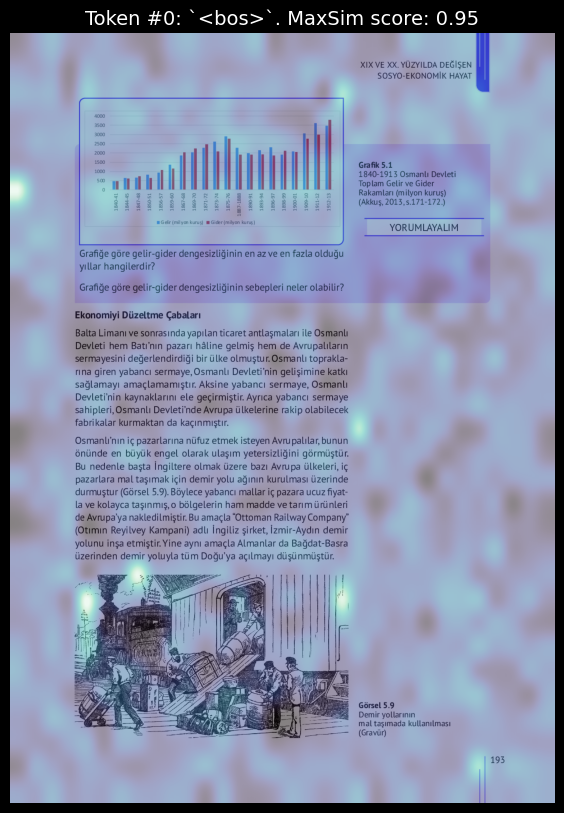
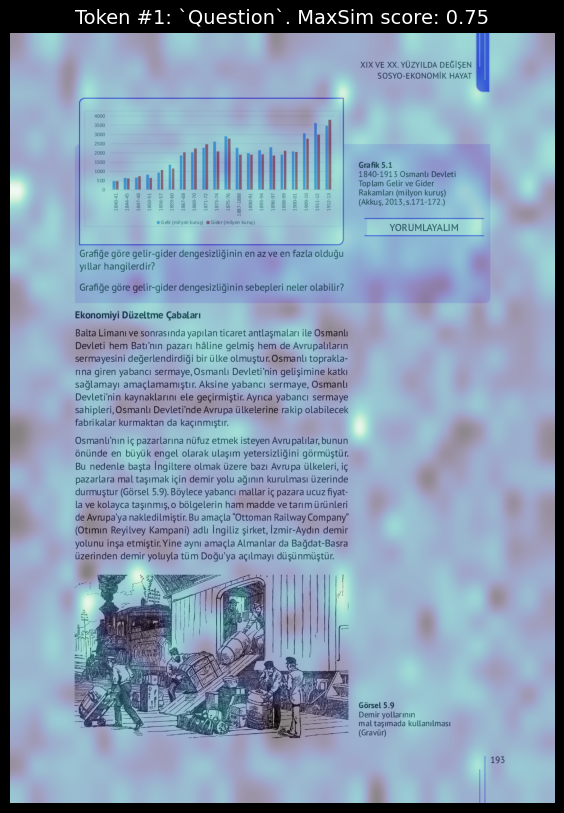
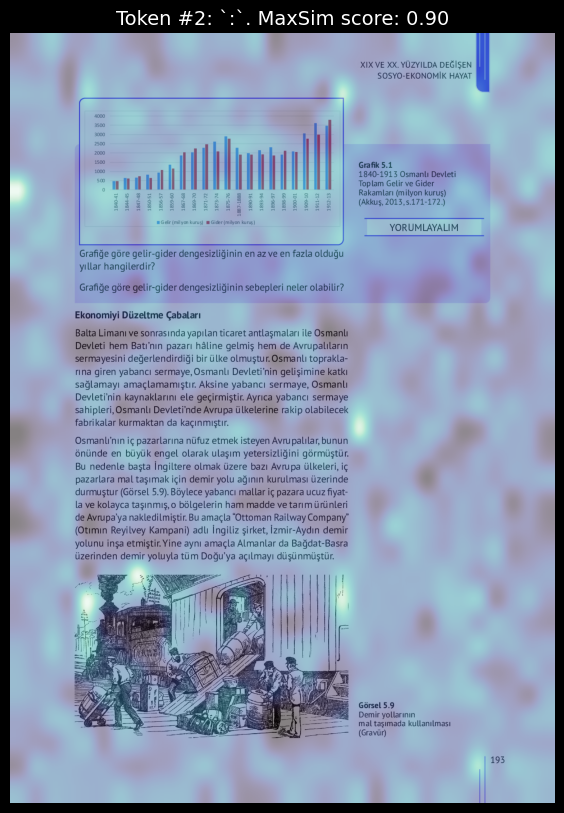
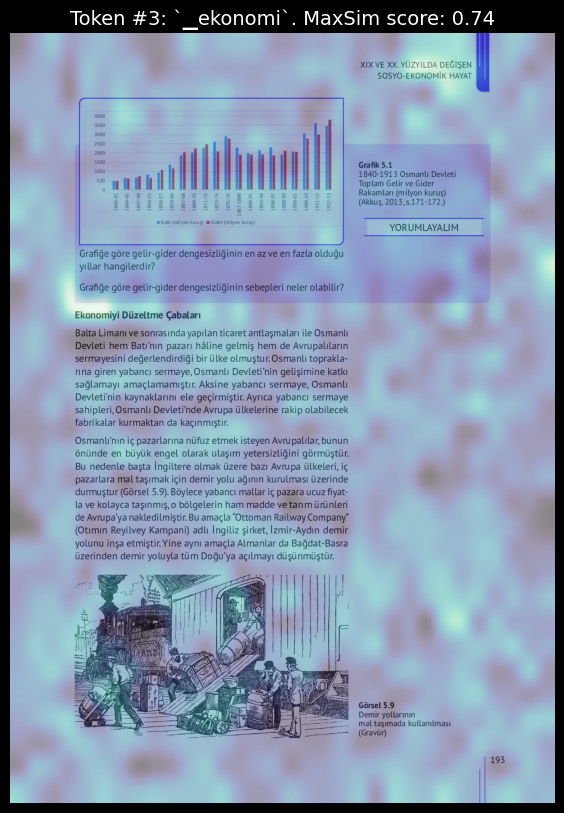
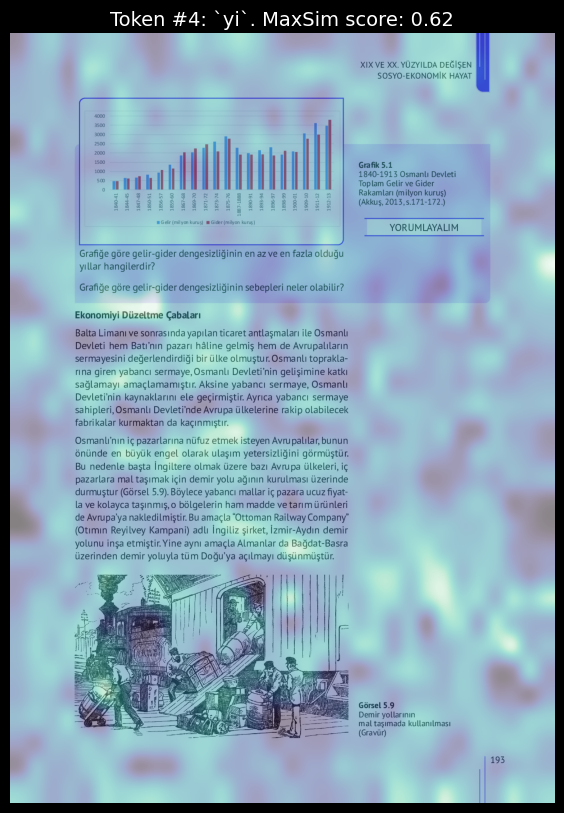
...
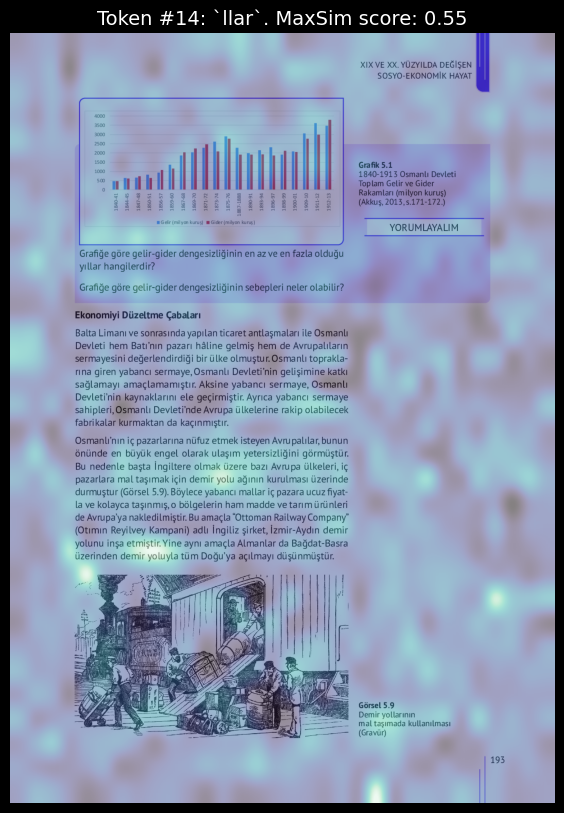
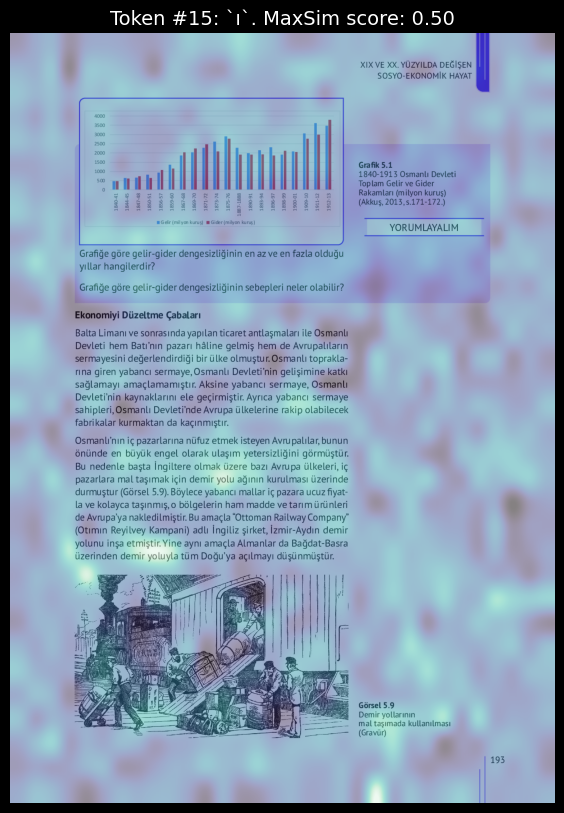
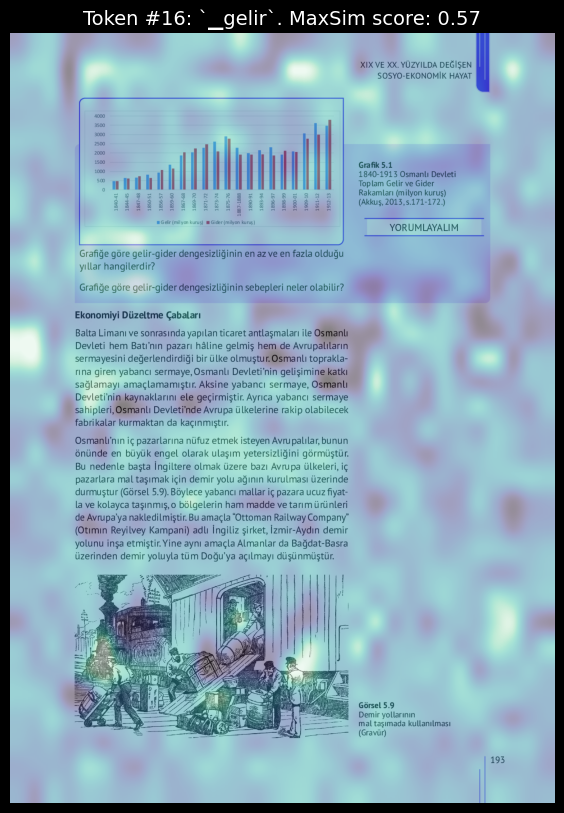
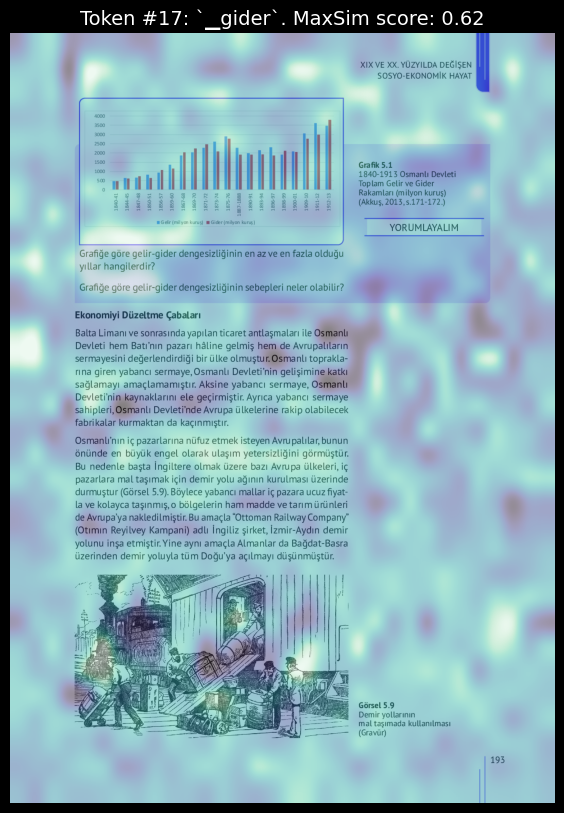
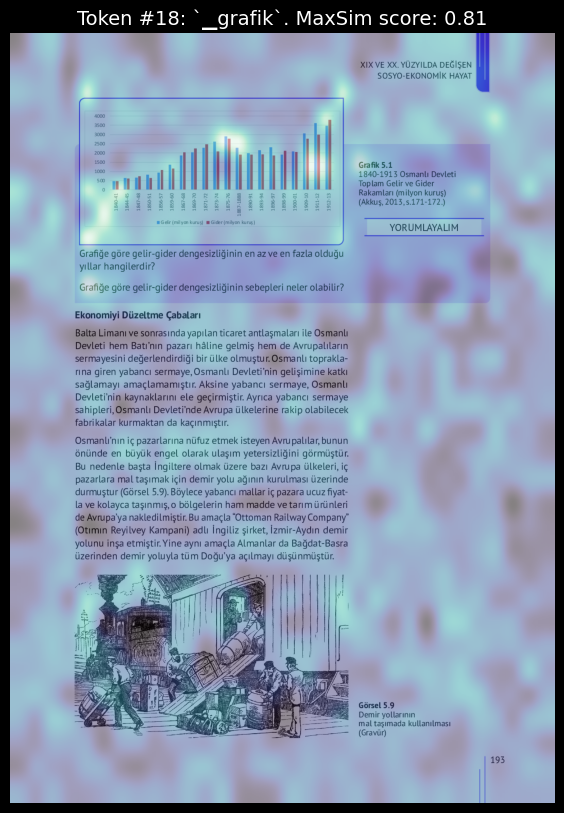

In [47]:
from IPython.display import HTML
import io
import base64

with plt.ioff():
    plots = plot_all_similarity_maps(
        image=image,
        query_tokens=query_tokens,
        similarity_maps=similarity_maps,
        figsize=(8,8),
        show_colorbar=False,
        add_title=True,
    )


html_content = '<div style="display: flex; flex-wrap: nowrap; overflow-x: auto;">'
for fig, ax in plots:
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight')
    buf.seek(0)
    data = base64.b64encode(buf.read()).decode('utf-8')
    # max-height değerini isteğinize göre ayarlayabilirsiniz
    html_content += f'<img src="data:image/png;base64,{data}" style="margin:0 10px; max-height:600px;" />'
html_content += '</div>'
display(HTML(html_content))
